In [1]:
import os
import pandas as pd 
import numpy as np
from tqdm import tqdm
import csv
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind, ttest_ind_from_stats

# Import pakages for machine learning
from sklearn.linear_model import LogisticRegression 
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

import lightgbm as lgb

# Deep neural network
from keras.models import Sequential
from keras.layers import Dense, Dropout

## 0. Preprocess simple PHS files

> define `is_all_time` == True of False

> if `is_all_time` == False, then specify `phs_name = phs_list[#]`

> add `is_match_winner` and `is_map_winner` features into the dataframe

In [2]:
# File path of prepared new_phs
path = "./data/"
phs_list = os.listdir(path)
phs_list = [file_name for file_name in phs_list if file_name.endswith(".csv")]
phs_list = phs_list[1:] # remove new_match_map_stats.csv from the list

# choose all time or specific season
is_all_time = False # set True if target data is all seasons data

if is_all_time == True:
    li = []
    for phs_name in phs_list:
        new_phs = pd.read_csv(f'{path}{phs_name}')
        li.append(new_phs)
    new_phs = pd.concat(li, axis=0, ignore_index=True)
    all_seasons = True

else:
    phs_name = phs_list[11] # set index of target csv file
    print(f'selected phs: {phs_name}')
    new_phs = pd.read_csv(f'{path}{phs_name}')
    all_seasons = False

new_phs['team_DI'] = new_phs[new_phs['team_name'] == new_phs['team_one_name']]['team_one_DI']
new_phs['team_DI'].fillna(new_phs['team_two_DI'], inplace=True)

selected phs: new_phs_2020_2.csv


## 1. Feature Engineering

> Define a `target_hero = All Heroes`

> remove features by `remove_feature`

> specify the data type `X, y = data_type[#]` among 0:'real', 1:'norm', 2:'10min avg'

In [3]:
# data collection
df = new_phs[['esports_match_id', 'player_name', 'team_name', 'map_name', 'stat_name', 'hero_name', 'stat_amount', 'team_DI', 'is_map_winner']]

# select target hero
'''
양팀 모두 같은 영웅을 쓴 것 아니면 normalize 에서 같이 비교하기 힘들다
'''
target_hero = 'All Heroes' # put 'All Heroes' for selecting all heroes

# data selection
df = df[df['hero_name'] == target_hero]

df = df.groupby(['esports_match_id', 'team_name', 'map_name', 'stat_name'])[['stat_amount', 'is_map_winner', 'team_DI']].mean()
df = df.unstack()

# get is_map_winner
is_map_winner = df[('is_map_winner', 'Time Played')]
is_map_winner.rename('is_map_winner', inplace=True)

# get team_DI
team_DI = df[('team_DI', 'Time Played')]
team_DI.rename('team_DI', inplace=True)

# check nan value
print(f'num of nan in is_map_winner: {is_map_winner.isna().sum()}')
print(f'num of nan in team_DI: {team_DI.isna().sum()}')

# engineer stats
df.drop(('is_map_winner',), axis=1, inplace=True) # drop is_map_winner column and leave only stat
df.drop(('team_DI',), axis=1, inplace=True) # drop team_DI column and leave only stat
df = df.xs('stat_amount', level=0, axis=1) # drop multilevel index

# Remove irrelevant features
remove_feature = ['Average Time Alive', 'Damage Done', 'Knockback Kills', 'Teleporter Pads Destroyed', 'Time Alive', 'Turrets Destroyed', 'Ultimates Earned - Fractional'] # Always remove these features
remove_feature.extend([]) # add features to be removed here
df = df[df.columns.difference(remove_feature)]

# data cleansing
df.fillna(0, inplace=True)
print(f'num of nan in df: {df.isna().sum().sum()}')

# normalize to 10 min average
df_10min = df.div(df['Time Played'], axis=0)
df_10min = df_10min * 600 # 10 min avg

print(f'num nan values in df_10min: {df_10min.isnull().sum().sum()}')

num of nan in is_map_winner: 0
num of nan in team_DI: 0
num of nan in df: 0
num nan values in df_10min: 0


In [94]:
with open('owl_colors.pickle', 'rb') as fr:
    owl_colors = pickle.load(fr)

owl_colors_dict = {}

for team in owl_colors.keys():
    fullName = owl_colors[team]['fullName']
    mainColor = owl_colors[team]['secondaryColor'] # get main team color here
    color_in_hex = owl_colors[team]['colors'][mainColor]['hex']
    print(fullName, mainColor, color_in_hex)
    owl_colors_dict.update({fullName:color_in_hex})

owl_colors_dict

Dallas Fuel strongBlue #0072CE
Atlanta Reign darkRed #910F1B
Boston Uprising yellow #EFDF00
Chengdu Hunters lightBrown #B4926A
Florida Mayhem pink #CF4691
Los Angeles Gladiators black #000000
Guangzhou Charge darkCyan #67A2B2
Houston Outlaws green #97D700
Hangzhou Spark blue #5788CE
London Spitfire orange #FF8200
New York Excelsior blue #0F57EA
Paris Eternal darkPink #8D042D
Philadelphia Fusion gray #DCDCDC
Seoul Dynasty gold #AA8A00
San Francisco Shock gray #A5ACAF
Shanghai Dragons black #000000
Toronto Defiant red #C10021
Los Angeles Valiant yellow #FFD100
Vancouver Titans green #2FB228
Washington Justice darkBlue #003768


{'Dallas Fuel': '#0072CE',
 'Atlanta Reign': '#910F1B',
 'Boston Uprising': '#EFDF00',
 'Chengdu Hunters': '#B4926A',
 'Florida Mayhem': '#CF4691',
 'Los Angeles Gladiators': '#000000',
 'Guangzhou Charge': '#67A2B2',
 'Houston Outlaws': '#97D700',
 'Hangzhou Spark': '#5788CE',
 'London Spitfire': '#FF8200',
 'New York Excelsior': '#0F57EA',
 'Paris Eternal': '#8D042D',
 'Philadelphia Fusion': '#DCDCDC',
 'Seoul Dynasty': '#AA8A00',
 'San Francisco Shock': '#A5ACAF',
 'Shanghai Dragons': '#000000',
 'Toronto Defiant': '#C10021',
 'Los Angeles Valiant': '#FFD100',
 'Vancouver Titans': '#2FB228',
 'Washington Justice': '#003768'}

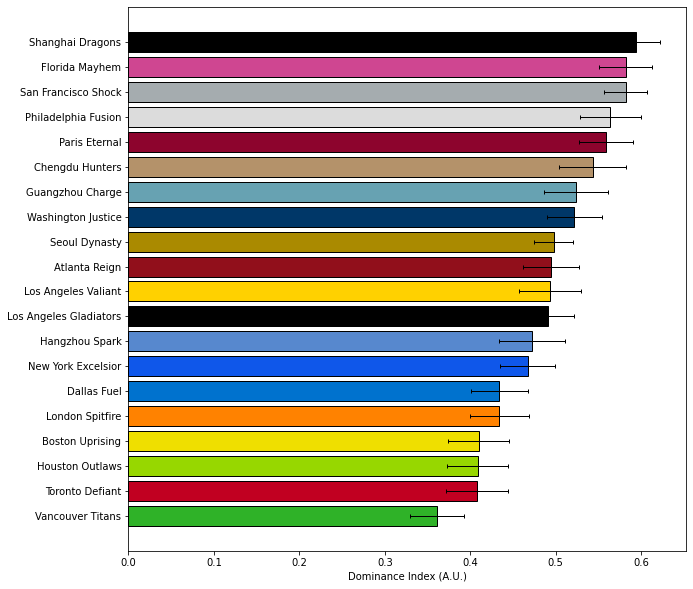

In [109]:
team_rank_df = pd.concat([df, team_DI], axis=1)

team_rank_df = team_rank_df.groupby(by='team_name')['team_DI'].agg(['mean', 'std', 'sem'])
team_rank_df = team_rank_df.sort_values(by='mean', ascending=True)
team_rank_df['color'] = team_rank_df.index.map(owl_colors_dict)
# display(team_rank_df)

plt.figure(figsize=(10,10))
plt.barh(team_rank_df.index.values, team_rank_df['mean'], color=team_rank_df['color'], edgecolor='black', xerr=team_rank_df['sem'], error_kw={'ecolor':'black', 'elinewidth':1, 'capsize':2})
plt.xlabel('Dominance Index (A.U.)')

plt.show()

## Data Transform

In [4]:
# Data Transform
X_real = df
y_real = team_DI

X_10min = df_10min
y_10min = team_DI
# Select X, y data type
'''
0: real
1: 10min
'''
# save data type here
data_type = []
data_type.append([X_real, y_real])
data_type.append([X_10min, y_10min])

X, y = data_type[1] # select data type with index
print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

# Set train, validation and test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

feature_names = X_train.columns

# Normalize the value with StandardScaler
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

X shape: (854, 29)
y shape: (854,)
(683, 29) (171, 29) (683,) (171,)


## 2. Data Analysis

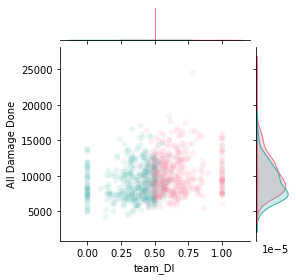

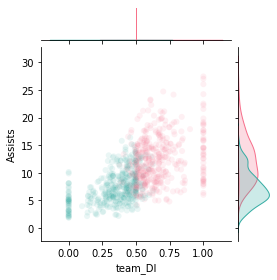

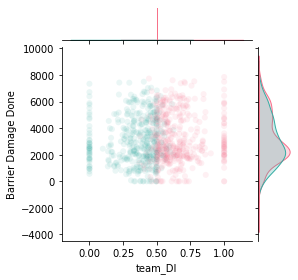

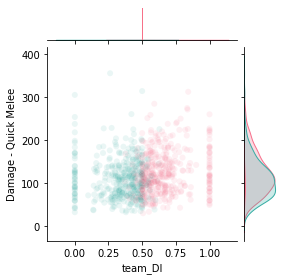

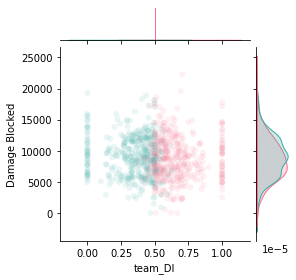

...

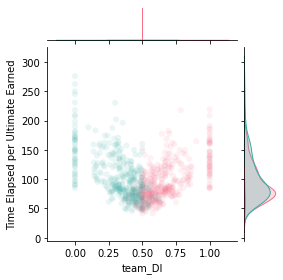

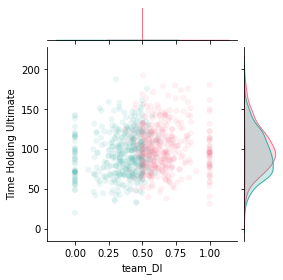

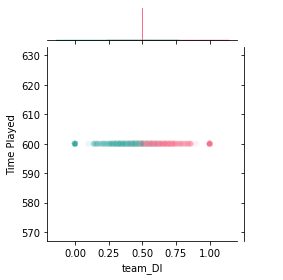

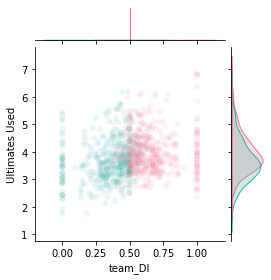

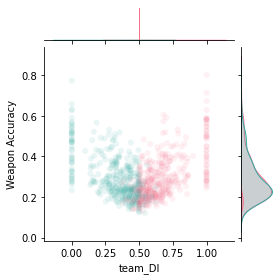

In [5]:
for stat in X.columns:
    h = sns.jointplot(x=y, y=X[stat], hue=is_map_winner, height=4, palette='husl', legend=False, alpha=0.1)

## 3. Regression Model

(683, 29) (171, 29) (683,) (171,)
29


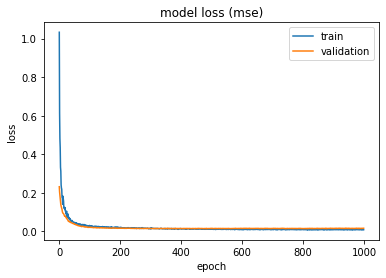

6/6 [==============================] - 0s 1ms/step - loss: 0.0181 - mae: 0.0957
evaluation: [0.018141843378543854, 0.0957048237323761]


In [7]:
# check input and target shape
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
num_input_node = X_train.shape[1]
print(num_input_node)

# Setup a model
model = Sequential()
# 1st layer
model.add(Dense(20, activation='relu', input_shape=(num_input_node,)))
model.add(Dropout(0.3))
# 2nd layer
model.add(Dense(20, activation='relu'))
model.add(Dropout(0.3))
# output layer
model.add(Dense(1)) # No activation function because this is regression, not classification

model.compile(optimizer='adam', loss='mse', metrics=['mae'])

history = model.fit(X_train, y_train, validation_split=0.25, epochs=1000, verbose=0)

# Plot model loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss (mse)')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

# Evaluate the model
evaluation = model.evaluate(x=X_test, y=y_test)
print(f'evaluation: {evaluation}')

Text(0.5, 0, 'Actual')

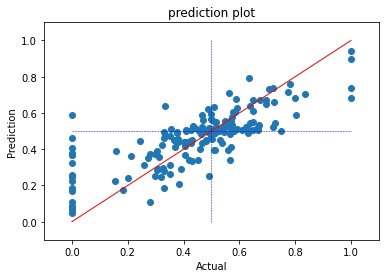

In [8]:
# plot predictions
y_pred = model.predict(X_test).flatten()
y_actual = y_test
plt.scatter(x=y_actual, y=y_pred)
plt.plot((0,1),(0,1), 'r', linewidth=1) # plot x=y line
plt.plot((0,1),(0.5,0.5), 'b--', linewidth=0.5) # plot grid
plt.plot((0.5,0.5),(0,1), 'b--', linewidth=0.5) # plot grid
plt.xlim(-0.1,1.1)
plt.ylim(-0.1,1.1)
plt.title('prediction plot')
plt.ylabel('Prediction')
plt.xlabel('Actual')

## 4. SHAP interpretation

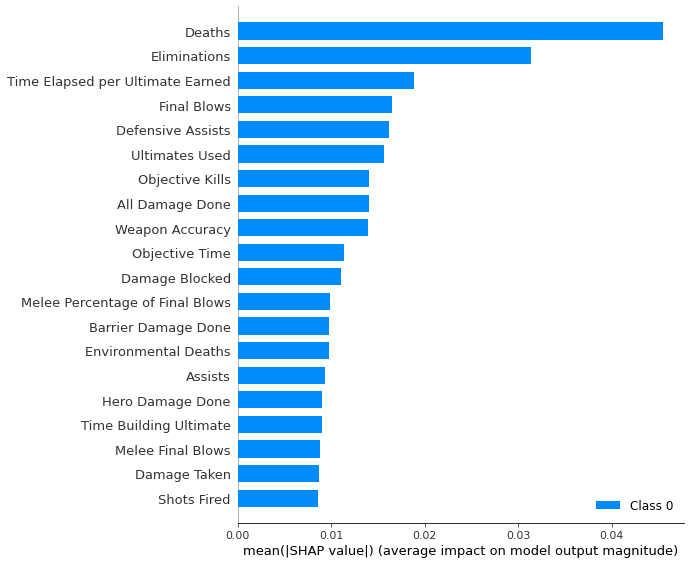

In [12]:
import shap

# load JS visualization code to notebook
shap.initjs()

# explain the model
explainer = shap.GradientExplainer(model, X_train)
shap_values = explainer.shap_values(X_test)

#
shap.summary_plot(shap_values, X_test, feature_names=feature_names)